In [2]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import json
import time
import ipdb
import cv2
import os
import pickle
import nltk
import time
import pylab as plot
## set seeds
from utils_picking import my_read_old, intersect, round_percent, get_indices_diff_list_suffix, vqa_score_list
import random
random.seed(1234)


In [3]:
### make changes here

TEST_SPLIT = 'val2014'
DIST_NORM = 1

results_edit_val_old = '/BS/vedika2/work/snmn/exp_vqa/eval_outputs_vqa_v2/vqa_v2_scratch_train/old_style_vqa_v2_edited_val2014_vqa_v2_scratch_train_15000_results.pickle'
results_val_old = '/BS/vedika2/work/snmn/exp_vqa/eval_outputs_vqa_v2/vqa_v2_scratch_train/old_style_vqa_v2_val2014_vqa_v2_scratch_train_15000_results.pickle'

## standard_vocab file_model_specific
standard_vocab_ans_file = '/BS/vedika2/work/snmn/exp_vqa/data/answers_vqa.txt'
with open(standard_vocab_ans_file) as f:
    ans_vocab_list = f.read().splitlines()


In [4]:
coco_json = '/BS/vedika2/work/snmn/coco_cat_ids.json'
with open(coco_json) as file:
    coco_f = json.load(file)
coco_dict = {}
for idx, details in enumerate(coco_f):
    # print(details)
    coco_dict[details['id']] = details['name']
coco_dict_inv = {}
for idx, details in enumerate(coco_f):
    # print(details)
    coco_dict_inv[details['name']] = details['id']

ques_type_file = '/BS/vedika3/work/VQA_helper_tools_official/QuestionTypes/mscoco_question_types.txt'
with open(ques_type_file) as f:
    ques_type_off = f.read().splitlines()
    
ans_type_off = ['yes/no', 'number', 'other']

img_dir = '/BS/databases10/VQA_v2/Images/' + TEST_SPLIT + '/'
edit_img_dir = '/BS/vedika2/work/thesis/final_edited_VQA_v2/Images/' + TEST_SPLIT + '/'
img_prefix_name = 'COCO_' + TEST_SPLIT + '_'

#### questions keys: 'image_id', 'question', 'question_id'
standard_questions_val_json = '/BS/databases10/VQA_v2/Questions/v2_OpenEnded_mscoco_' + TEST_SPLIT + '_questions.json'
standard_questions_edit_val_json = '/BS/vedika2/work/thesis/final_edited_VQA_v2/Questions/v2_OpenEnded_mscoco_' + TEST_SPLIT + '_questions.json'

## ann keys: 'image_id', 'question_id', 'answers' , 'multiple_choice_answer'(the most frequent answer), 'question_type', 'answer_type'
standard_annotations_val_json = '/BS/databases10/VQA_v2/Annotations/v2_mscoco_' + TEST_SPLIT + '_annotations.json'
standard_annotations_edit_val_json = '/BS/vedika2/work/thesis/final_edited_VQA_v2/Annotations/v2_mscoco_' + TEST_SPLIT + '_annotations.json'

qid_val, pred_ans_val , ss_vc_val, img_ids_val, ques_val, all_ans_val, ques_type_val, ans_type_val, gt_ans_used_val = \
    my_read_old(results_val_old, standard_questions_val_json, standard_annotations_val_json)
qid_edit_val, pred_ans_edit_val , ss_vc_edit_val, img_ids_edit_val, ques_edit_val, all_ans_edit_val, ques_type_edit_val, ans_type_edit_val, gt_ans_used_edit_val = \
    my_read_old(results_edit_val_old, standard_questions_edit_val_json, standard_annotations_edit_val_json)
len_val = len(img_ids_val)
len_edit_val = len(img_ids_edit_val)
all_indices_val = np.arange(len_val)
all_indices_edit_val = np.arange(len_edit_val)

## creating dictionary for val set - to facilitate extensions based on q_id index
qid_ss_predans_val = {}
for idx, a in enumerate(qid_val):
    qid_ss_predans_val[a] = (ss_vc_val[idx], pred_ans_val[idx])

extended_ss_vc_val = [qid_ss_predans_val[q_id][0] for q_id in qid_edit_val]
extended_pred_ans_val = [qid_ss_predans_val[q_id][1] for q_id in qid_edit_val] 

# you need two ploits= |v1-v2|; max(v1[i])- v2[i][argmax[v1[i]]]
st = time.time()
L_norm_diff = [np.linalg.norm((extended_ss_vc_val[i] - ss_vc_edit_val[i]), ord=DIST_NORM) for i in range(len_edit_val)]
print('time taken for calculating dist_norm_bw_ss_vc', time.time() - st)

### for getting the softmax score of answer predicted
ext_ss_max_value_val = [np.max(ss_vc) for ss_vc in extended_ss_vc_val]  ## == [extended_ss_vc_val[idx][val] for idx,val in enumerate(extended_pred_ans_id_val)]
ss_value_at_val_edit_val = [ss_vc_edit_val[idx][val] for idx, val in enumerate(extended_pred_ans_val)]  # STAYS SAME!
diff_ss_val_label = [ext_ss_max_value_val[i] - ss_value_at_val_edit_val[i] for i in range(len_edit_val)]  ##### this is to be PLOTTED!
# diff_ss_val_label = [np.max(extended_ss_vc_val[i]) - ss_vc_edit_val[i][np.argmax([v1[i])]]for i in range(len_edit_val)]


7.4407477378845215
15.823515892028809
time taken for calculating dist_norm_bw_ss_vc 8.203705549240112


In [5]:
###                                         STATISTICS

## one match answer is good
accuracy_ind_before = [i for i in range(len_val) if ans_vocab_list[pred_ans_val[i]] in all_ans_val[i]]
accuracy_ind_before_extended = [i for i in range(len_edit_val) if ans_vocab_list[extended_pred_ans_val[i]] in all_ans_edit_val[i]]
accuracy_ind_after = [i for i in range(len_edit_val) if ans_vocab_list[pred_ans_edit_val[i]] in all_ans_edit_val[i]]
print('accuracy before editing, one answer match is good', round_percent(len(accuracy_ind_before) / len_val), len(accuracy_ind_before))
print('accuracy before editing_extended', round_percent(len(accuracy_ind_before_extended) / len_edit_val), len(accuracy_ind_before_extended))
print('accuracy after editing, one answer match is good', round_percent(len(accuracy_ind_after) / len_edit_val), len(accuracy_ind_after))

##official_way
off_score_val = vqa_score_list(all_ans_val, pred_ans_val, ans_vocab_list)
off_score_val_extended = vqa_score_list(all_ans_edit_val, extended_pred_ans_val, ans_vocab_list)
off_score_edit_val = vqa_score_list(all_ans_edit_val, pred_ans_edit_val, ans_vocab_list)
print('official accuracy before editing', round_percent(np.sum(off_score_val) / len_val))
print('official accuracy before editing_ extended', round_percent(np.sum(off_score_val_extended) / len_edit_val))
print('official accuracy after editing', round_percent(np.sum(off_score_edit_val) / len_edit_val))

##authors way
author_val_acc = np.sum([pred_ans_val[i] == gt_ans_used_val[i] for i in range(len_val)]) / len_val
author_val_extended_acc = np.sum([extended_pred_ans_val[i] == gt_ans_used_edit_val[i] for i in range(len_edit_val)]) / len_edit_val
author_edit_val_acc = np.sum([pred_ans_edit_val[i] == gt_ans_used_edit_val[i] for i in range(len_edit_val)]) / len_edit_val
print('authors accuracy before editing', round_percent(author_val_acc))
print('authors accuracy before editing_extended', round_percent(author_val_extended_acc))
print('authors accuracy after editing', round_percent(author_edit_val_acc))

### for entire set counting how mnay labels flipped
labels_flipped_count = np.sum([extended_pred_ans_val[i] != val for i, val in enumerate(pred_ans_edit_val)])
labels_remained_same_count = np.sum([extended_pred_ans_val[i] == val for i, val in enumerate(pred_ans_edit_val)])
assert (labels_flipped_count + labels_remained_same_count == len(pred_ans_edit_val))
print('#labels flipped for entire set=', labels_flipped_count, '#labels remained same=', labels_remained_same_count)
print('#labels flipped for entire set %=', round_percent(labels_flipped_count / len_edit_val), '#labels remained same %=', round_percent(labels_remained_same_count / len_edit_val))

lab_fl_ind = [i for i in range(len_edit_val) if extended_pred_ans_val[i] != pred_ans_edit_val[i]]
# label i.e ans was wrong before- right now- one match to 10gt ans is okay
lab_fl_pos = [i for i in lab_fl_ind if ans_vocab_list[extended_pred_ans_val[i]] not in all_ans_edit_val[i] and ans_vocab_list[pred_ans_edit_val[i]] in all_ans_edit_val[i]]
# label i.e ans was right before- now wrong - one match to 10gt ans is okay
lab_fl_neg = [i for i in lab_fl_ind if ans_vocab_list[extended_pred_ans_val[i]] in all_ans_edit_val[i] and ans_vocab_list[pred_ans_edit_val[i]] not in all_ans_edit_val[i]]
lab_fl_right = [i for i in lab_fl_ind if ans_vocab_list[extended_pred_ans_val[i]] in all_ans_edit_val[i] and ans_vocab_list[pred_ans_edit_val[i]] in all_ans_edit_val[i]]
lab_fl_wrong = [i for i in lab_fl_ind if ans_vocab_list[extended_pred_ans_val[i]] not in all_ans_edit_val[i] and ans_vocab_list[pred_ans_edit_val[i]] not in all_ans_edit_val[i]]
print('#labels flipped that show a positive change', len(lab_fl_pos), round_percent(len(lab_fl_pos) / len(lab_fl_ind)), '%')
print('#labels flipped that show a negative change', len(lab_fl_neg), round_percent(len(lab_fl_neg) / len(lab_fl_ind)), '%')
print('#labels flipped that are both right', len(lab_fl_right), round_percent(len(lab_fl_right) / len(lab_fl_ind)), '%')
print('#labels flipped that are both wrong', len(lab_fl_wrong), round_percent(len(lab_fl_wrong) / len(lab_fl_ind)), '%')



accuracy before editing, one answer match is good 65.428 140248
accuracy before editing_extended 64.733 332893
accuracy after editing, one answer match is good 63.221 325122
official accuracy before editing 58.341
official accuracy before editing_ extended 57.605
official accuracy after editing 56.135
authors accuracy before editing 45.564
authors accuracy before editing_extended 44.917
authors accuracy after editing 43.665
#labels flipped for entire set= 71189 #labels remained same= 443070
#labels flipped for entire set %= 13.843 #labels remained same %= 86.157
#labels flipped that show a positive change 13642 19.163 %
#labels flipped that show a negative change 21413 30.079 %
#labels flipped that are both right 13880 19.497 %
#labels flipped that are both wrong 22254 31.26 %


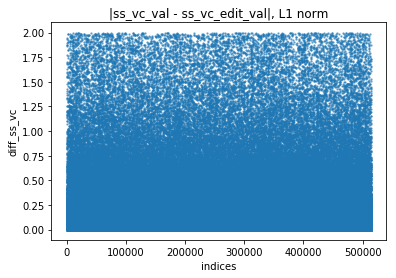

In [6]:
## plot1 L NORM
all_indices = np.arange(len_edit_val).tolist()
## sample figure
fig = plt.figure();
ax = plt.subplot();
ax.scatter(all_indices, L_norm_diff, alpha=0.5, cmap=plt.cm.plasma, s=2)
plt.title('|ss_vc_val - ss_vc_edit_val|, L1 norm')
plt.xlabel('indices')
plt.ylabel('diff_ss_vc')
plt.show()

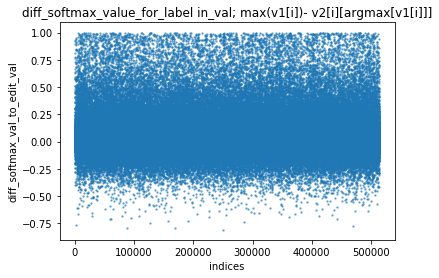

In [9]:
## PLOT2 - softmax_val difference  ;  max(v1[i])- v2[i][argmax[v1[i]]]  v1- val; v2- edit_val
fig = plt.figure();
ax = plt.subplot();
ax.scatter(all_indices, diff_ss_val_label, alpha=0.5, cmap=plt.cm.plasma, s=2)
plt.title('diff_softmax_value_for_label in_val; max(v1[i])- v2[i][argmax[v1[i]]]')
plt.xlabel('indices')
plt.ylabel('diff_softmax_val_to_edit_val')
plt.show()

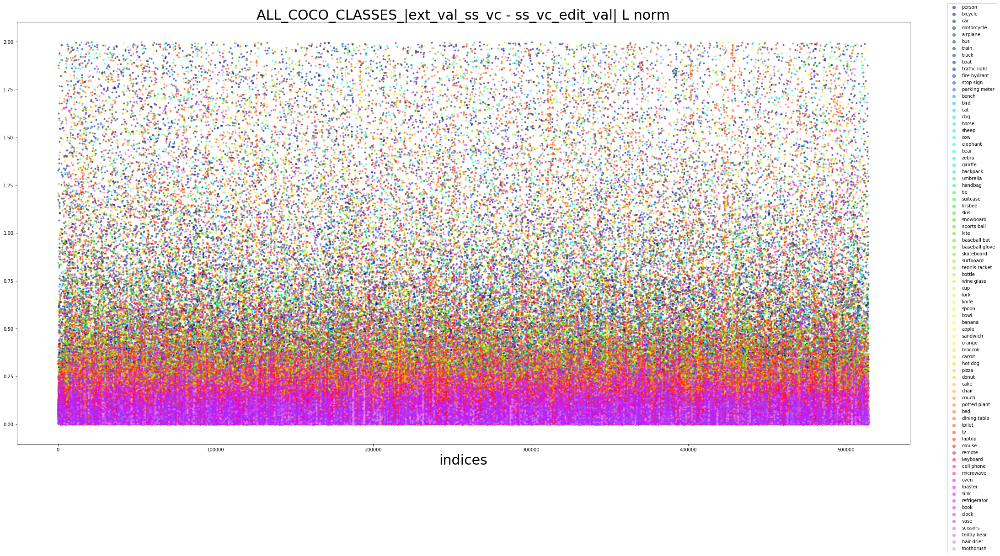

In [18]:
## PLOTTING ALL
params = {'legend.fontsize': 10}
plot.rcParams.update(params)
params = {'legend.markerscale': 2}
plot.rcParams.update(params)

fig = plt.figure(figsize=(35, 17))
ax = fig.add_subplot(111)
#plt.title('ALL_COCO_CLASSES_diff_softmax_value; max(v1[i])- v2[i][argmax[v1[i]]]', fontsize=30)
plt.title('ALL_COCO_CLASSES_|ext_val_ss_vc - ss_vc_edit_val| L norm', fontsize=30)
plt.xlabel('indices', fontsize=30)
for i in coco_dict_inv.keys():  
    #print('object removed:', i)
    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, 
        CLASS=i)
    ax.scatter(chosen_indices, chosen_diff_list_norm, label=i, alpha=0.5, s=10)
    
colormap = plt.cm.gist_ncar  # plasma   #gist_ncar #nipy_spectral, Set1,Paired  
colorst = [colormap(i) for i in np.linspace(0, 0.9, len(ax.collections))]
for t, j1 in enumerate(ax.collections):
    j1.set_color(colorst[t])
    
ax.legend(bbox_to_anchor=(1.1, 1.05))  # (1.1, 1.05))
plt.show()

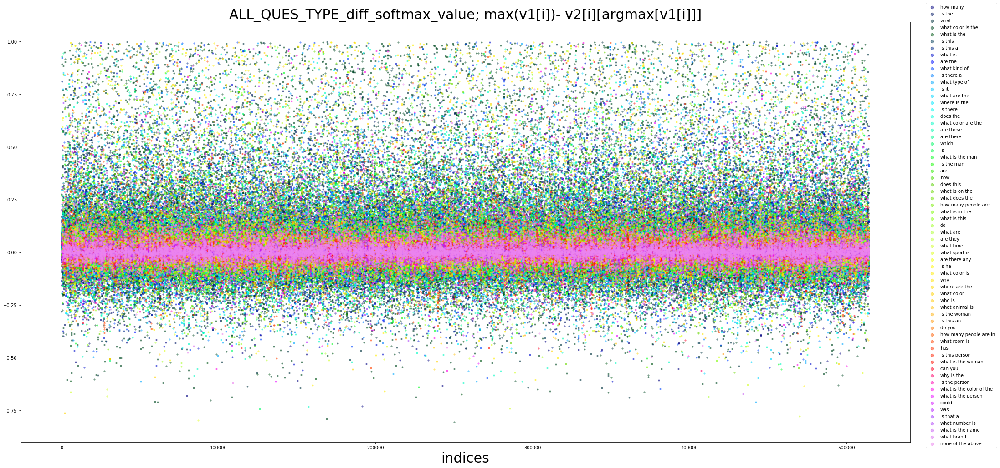

In [19]:
## PLOTTING ALL
params = {'legend.fontsize': 10}
plot.rcParams.update(params)
params = {'legend.markerscale': 2}
plot.rcParams.update(params)

fig = plt.figure(figsize=(35, 17))
ax = fig.add_subplot(111)
plt.title('ALL_QUES_TYPE_diff_softmax_value; max(v1[i])- v2[i][argmax[v1[i]]]', fontsize=30)
#plt.title('ALL_QUES_TYPE |ext_val_ss_vc - ss_vc_edit_val| L norm', fontsize=30)
plt.xlabel('indices', fontsize=30)
for i in ques_type_off:  
    #print('QUES_TYPE:', i)
    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, 
        QUES_TYPE=i)
    ax.scatter(chosen_indices, chosen_diff_list_value, label=i, alpha=0.5, s=10)
    
colormap = plt.cm.gist_ncar  # plasma   #gist_ncar #nipy_spectral, Set1,Paired  
colorst = [colormap(i) for i in np.linspace(0, 0.9, len(ax.collections))]
for t, j1 in enumerate(ax.collections):
    j1.set_color(colorst[t])
    
ax.legend(bbox_to_anchor=(1.1, 1.05))  # (1.1, 1.05))
plt.show()

ANS_TYPE: yes/no
ANS_TYPE: number
ANS_TYPE: other


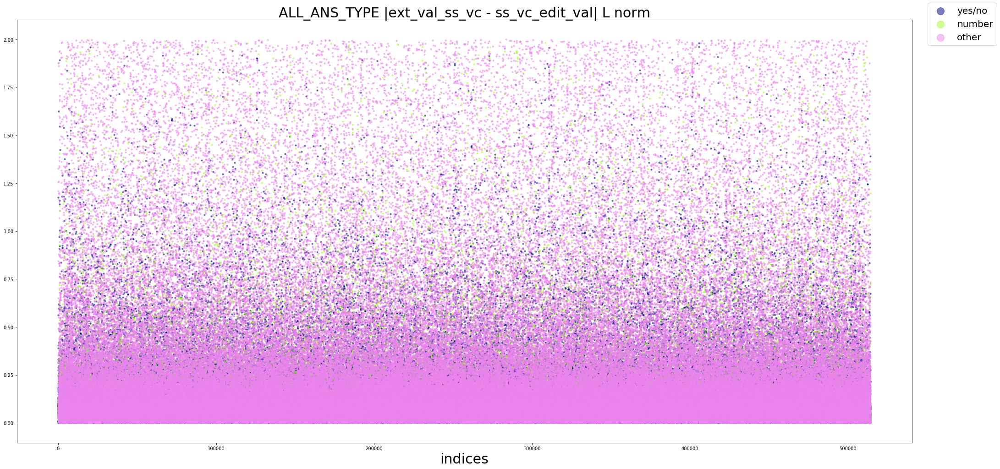

In [20]:
params = {'legend.fontsize': 20}
plot.rcParams.update(params)
params = {'legend.markerscale': 5}
plot.rcParams.update(params)

fig = plt.figure(figsize=(35, 17))
ax = fig.add_subplot(111)
#plt.title('ALL_ANS_TYPE_diff_softmax_value; max(v1[i])- v2[i][argmax[v1[i]]]', fontsize=30)
plt.title('ALL_ANS_TYPE |ext_val_ss_vc - ss_vc_edit_val| L norm', fontsize=30)
plt.xlabel('indices', fontsize=30)
for i in ans_type_off:  
    print('ANS_TYPE:', i)
    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, 
        ANS_TYPE=i)
    ax.scatter(chosen_indices, chosen_diff_list_norm, label=i, alpha=0.5, s=10)
    
colormap = plt.cm.gist_ncar  # plasma   #gist_ncar #nipy_spectral, Set1,Paired  
colorst = [colormap(i) for i in np.linspace(0, 0.9, len(ax.collections))]
for t, j1 in enumerate(ax.collections):
    j1.set_color(colorst[t])
    
ax.legend(bbox_to_anchor=(1.1, 1.05))  # (1.1, 1.05))
plt.show()

In [27]:
#SET BACK TO DEFAULT
plt.rcParams.update(plt.rcParamsDefault)

number of IQA triplets related to answer type: number is 67227
number of IQA triplets in common: 67227


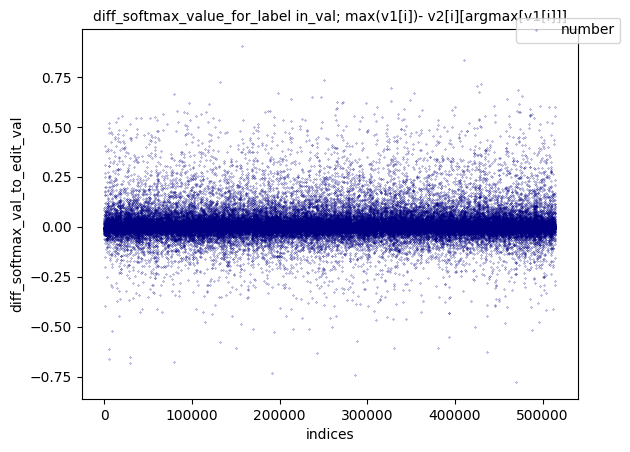

In [30]:
### INDIVIDUAL PLOT IF YOU WANT
fig = plt.figure()
#fig = plt.figure(figsize=(7.5,5))
ax = fig.add_subplot(111)
plt.title('diff_softmax_value_for_label in_val; max(v1[i])- v2[i][argmax[v1[i]]]', fontsize=10)
plt.xlabel('indices', fontsize=10)
plt.ylabel('diff_softmax_val_to_edit_val', fontsize=10)
CLASS_ID = None
QUES_TYPE = None
ANS_TYPE =  None
for i in ['number']: 
    #print('object removed:', CLASS_ID, coco_dict[CLASS_ID])
    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, 
        ANS_TYPE=i)
    ax.scatter(chosen_indices,chosen_diff_list_value, label= i, s=0.05)
colormap = plt.cm.gist_ncar #plasma   #gist_ncar #nipy_spectral, Set1,Paired  
colorst = [colormap(i) for i in np.linspace(0, 0.9,len(ax.collections))]       
for t,j1 in enumerate(ax.collections):
    j1.set_color(colorst[t])
ax.legend(bbox_to_anchor=(1.1,1.05))

In [95]:
# FROM NOW ON JUST FOR THE BARPLOTS- RUN THE BELOW CELLS
# for i in coco_dict_inv.keys():    CLASS=i
# for i in ques_type_off:     QUES_TYPE= i
# for i in ans_type_off:      ANS_TYPE = i
# bars = bars_coco/bars_q/bars_a

setting = 'ans' #'coco'  #'ques' , 'ans'

bars_coco = [coco_dict[i] for i in coco_dict.keys()]   ## class_labels
bars_q = ques_type_off
bars_a = ans_type_off
bars = bars_a

FROM NOW ON JUST FOR THE BARPLOTS- RUN THE BELOW CELLS
for i in coco_dict_inv.keys():    CLASS=i
for i in ques_type_off:     QUES_TYPE= i
for i in ans_type_off:      ANS_TYPE = i

In [96]:
labels_flipped_cnt = []  ### within the labels_flipped: how many moved to positive / negative change
chosen_indices_len = []
lab_fl_neg_cnt = []
lab_fl_ps_cnt = []
true_labels_before_len = []
true_labels_after_len = []

for i in ans_type_off:   

    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, 
        ANS_TYPE=i)
    
    len_c = len(chosen_indices)
    
    ## one match answer is good
    accuracy_ind_before_extended = [i for i in chosen_indices if ans_vocab_list[extended_pred_ans_val[i]] in all_ans_edit_val[i]]
    accuracy_ind_after = [i for i in chosen_indices if ans_vocab_list[pred_ans_edit_val[i]] in all_ans_edit_val[i]]
    #print('accuracy before editing_extended', round_percent(len(accuracy_ind_before_extended) / len_c), len(accuracy_ind_before_extended))
    #print('accuracy after editing, one answer match is good', round_percent(len(accuracy_ind_after) / len_c), len(accuracy_ind_after))
    
    lab_fl_indices = [i for i in chosen_indices if extended_pred_ans_val[i] != pred_ans_edit_val[i]]    
    ## one answer match- is good too #not going by the official evaluation
    #i.e ans was wrong before- now right - one match to 10gt ans is okay   
    lab_fl_neg_ch = [i for i in lab_fl_indices if ans_vocab_list[extended_pred_ans_val[i]] in all_ans_edit_val[i] and ans_vocab_list[pred_ans_edit_val[i]] not in all_ans_edit_val[i]] 
     #i.e ans was right before- now wrong - one match to 10gt ans is okay
    lab_fl_pos_ch= [i for i in lab_fl_indices if ans_vocab_list[extended_pred_ans_val[i]] not in all_ans_edit_val[i] and ans_vocab_list[pred_ans_edit_val[i]] in all_ans_edit_val[i]]   
    #if len(lab_fl_neg_ch)+ len(lab_fl_pos_ch) != len(lab_fl_indices):
    #    print('answers did change but for #',len(lab_fl_indices)-len(lab_fl_neg_ch), 'indices- after change-label did match to one of the answers')

    labels_flipped_count = np.sum([extended_pred_ans_val[i] != pred_ans_edit_val[i] for i in chosen_indices]) ##==len(lab_fl_indices)
    labels_remained_same_count= np.sum([extended_pred_ans_val[i] == pred_ans_edit_val[i] for i in chosen_indices])
    assert(labels_flipped_count+ labels_remained_same_count == len(chosen_indices))
    #print('#labels flipped=', labels_flipped_count, '#labels remained same=', labels_remained_same_count) 
    #print('#labels flipped %=',round_percent(labels_flipped_count/ len(chosen_indices)), '#labels remained same %=', round_percent(labels_remained_same_count/ len(chosen_indices))) 
    
    lab_fl_neg_cnt.append(len(lab_fl_neg_ch))
    lab_fl_ps_cnt.append(len(lab_fl_pos_ch))
    labels_flipped_cnt.append(labels_flipped_count)
    chosen_indices_len.append(len(chosen_indices))
    true_labels_before_len.append(len(accuracy_ind_before_extended))
    true_labels_after_len.append(len(accuracy_ind_after))

labels_flipped_percent = [round(labels_flipped_cnt[i]*100/chosen_indices_len[i],3) for i in range(len(chosen_indices_len))]
lb_fl_pos_percent = [round(lab_fl_ps_cnt[i]*100/labels_flipped_cnt[i],3) for i in range(len(labels_flipped_cnt))]
lb_fl_neg_percent = [round(lab_fl_neg_cnt[i]*100/labels_flipped_cnt[i],3) for i in range(len(labels_flipped_cnt))]
true_labels_before_percent = [round_percent(true_labels_before_len[i]/chosen_indices_len[i]) for i in range(len(chosen_indices_len))]
true_labels_after_percent = [round_percent(true_labels_after_len[i]/chosen_indices_len[i]) for i in range(len(chosen_indices_len))]

number of IQA triplets related to answer type: yes/no is 199200
number of IQA triplets in common: 199200
number of IQA triplets related to answer type: number is 67227
number of IQA triplets in common: 67227
number of IQA triplets related to answer type: other is 247832
number of IQA triplets in common: 247832


In [97]:
bars

['yes/no', 'number', 'other']

In [98]:
#######PLOTS: FOR THOSE THATS AFFECTED- SO LABELS_FLIPPED
#np.array(sorted_neg_labels[::-1])
# x- sorted_neg_labels
# y - np.sort(all_neg_percent)


#### labels count absolute numbers sorted barplot
sort_cnt = np.sort(labels_flipped_cnt)
sort_cnt_xticks = [bars[i] for i in np.argsort(labels_flipped_cnt)]

#### labels flipped absolute numbers sorted barplot
sort_abs = np.sort(labels_flipped_cnt)
sort_abs_xticks = [bars[i] for i in np.argsort(labels_flipped_cnt)]
sort_percent = np.sort(labels_flipped_percent)
sort_percent_xticks = [bars[i] for i in np.argsort(labels_flipped_percent)]

#off labels flipped- postive change
sort_pos_ch_abs = np.sort(lab_fl_ps_cnt)
sort_pos_ch_abs_xticks = [bars[i] for i in np.argsort(lab_fl_ps_cnt)]
sort_pos_ch_percent = np.sort(lb_fl_pos_percent)
sort_pos_ch_percent_xticks = [bars[i] for i in np.argsort(lb_fl_pos_percent)]

## off labels flipped negative change
sort_neg_ch_abs = np.sort(lab_fl_neg_cnt)
sort_neg_ch_abs_xticks = [bars[i] for i in np.argsort(lab_fl_neg_cnt)]
sort_neg_ch_percent = np.sort(lb_fl_neg_percent)
sort_neg_ch_percent_xticks = [bars[i] for i in np.argsort(lb_fl_neg_percent)]



In [108]:
if setting == 'coco':
    x_label = 'coco_classes';
    figsz=(35,17) ;
    fontsz = 30;
    fontsz_xticks = 20;
    fontsz_yticks = 25
    
if setting == 'ques':
    x_label = 'question_types';
    figsz=(35,17) ;
    fontsz = 30;
    fontsz_xticks = 20;
    fontsz_yticks = 25
    
if setting == 'ans':
    figsz = (4,3)
    x_label = 'answer types' ; 
    fontsz = 15;
    fontsz_xticks = 10;
    fontsz_yticks = 10   ;

In [109]:
figsz

(4, 3)

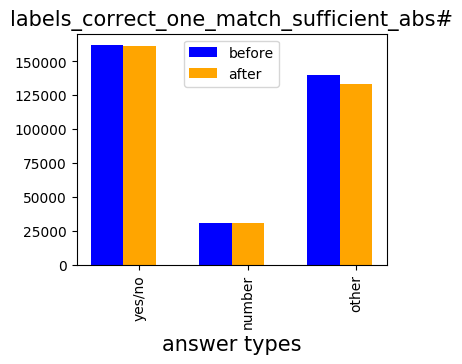

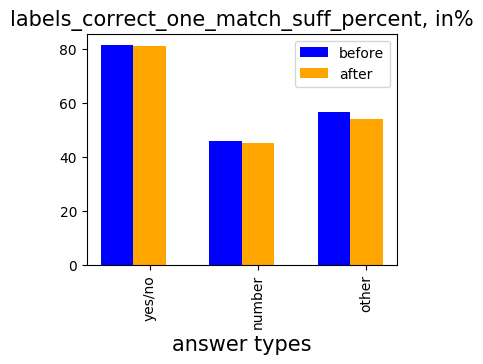

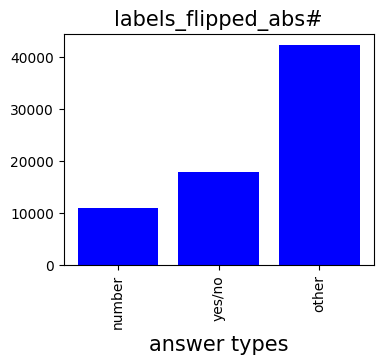

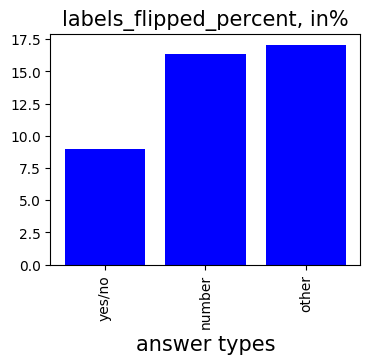

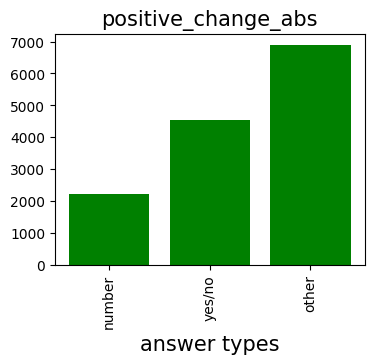

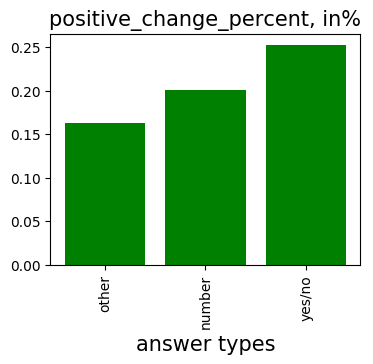

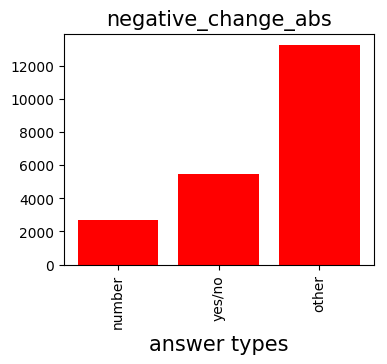

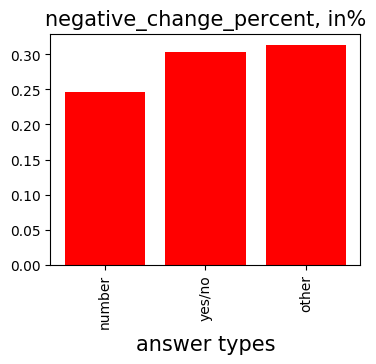

In [110]:
y1 = true_labels_before_len ##accuracy plot
y2 = true_labels_after_len
xticks = bars
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.3
plt.bar(y_pos-width, y1, color='blue', width=width, label='before')
plt.bar(y_pos, y2, color='orange', width=width, label='after')
plt.title('labels_correct_one_match_sufficient_abs#', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.legend()
plt.show()

y1 = true_labels_before_percent ##accuracy plot
y2 = true_labels_after_percent
xticks = bars
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.3
plt.bar(y_pos-width, y1, color='blue', width=width, label='before')
plt.bar(y_pos, y2, color='orange', width=width, label='after')
plt.title('labels_correct_one_match_suff_percent, in%', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.legend()
plt.show()

y = sort_abs    
xticks = sort_abs_xticks
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.8
plt.bar(y_pos, y, color='b', width=width)
plt.title('labels_flipped_abs#', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.show()

y = sort_percent    
xticks = sort_percent_xticks
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.8
plt.bar(y_pos, y, color='b', width=width)
plt.title('labels_flipped_percent, in%', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.show()


y = sort_pos_ch_abs   
xticks = sort_pos_ch_abs_xticks
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.8
plt.bar(y_pos, y, color='g', width=width)
plt.title('positive_change_abs', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.show()

y = sort_pos_ch_percent    
xticks = sort_pos_ch_percent_xticks
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.8
plt.bar(y_pos, y, color='g', width=width)
plt.title('positive_change_percent, in%', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.show()

y = sort_neg_ch_abs   
xticks = sort_neg_ch_abs_xticks
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.8
plt.bar(y_pos, y, color='r', width=width)
plt.title('negative_change_abs', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.show()

y = sort_neg_ch_percent    
xticks = sort_neg_ch_percent_xticks
y_pos = np.arange(len(bars))
fig = plt.figure(figsize=figsz)
width = 0.8
plt.bar(y_pos, y, color='r', width=width)
plt.title('negative_change_percent, in%', fontsize=fontsz) 
plt.xlabel(x_label, fontsize=fontsz)
plt.xticks(y_pos, xticks ,rotation='vertical', fontsize=fontsz_xticks)
plt.yticks(fontsize=fontsz_yticks)
plt.show()



In [16]:
# # SET BACK TO DEFAULT
# plt.rcParams.update(plt.rcParamsDefault)

# # TRIAL
# x = np.arange(10)
# x_1 = []
# x_2 = []
# for i in range(80):
#     x_1.append(np.random.rand(len(x)))
#     x_2.append(np.random.rand(len(x)))

# for i in range(2):

#     f = plt.figure(figsize=(8,2.5))
#     ax = f.add_subplot(121)
#     ax2 = f.add_subplot(122)
    
#     ax2.scatter(x, x_2[i])

#     ax.set_title('diff_in_softmax_value_label:')
#     ax.scatter(x, x_1[i], alpha=0.5, s=2)
#     ax.set_xlabel('indices')

#     ax2.set_title(' L dist norm |ss_vc_val - ss_vc_edit_val|:')
#     ax.scatter(x, x_1[i])
#     ax2.set_xlabel('indices')

/BS/vedika/static00/anaconda3/envs/vqa_adv/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


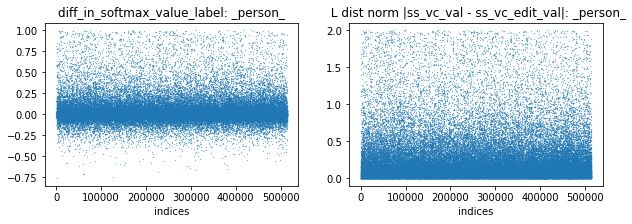

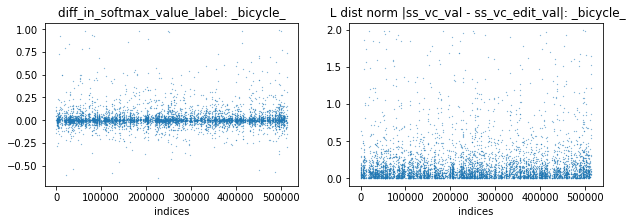

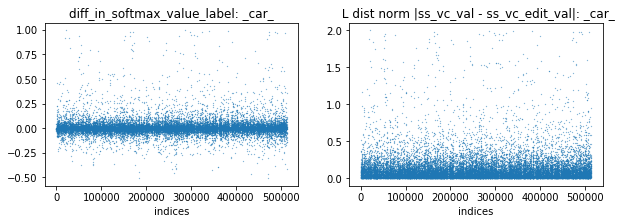

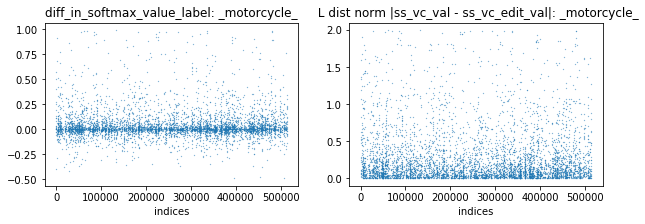

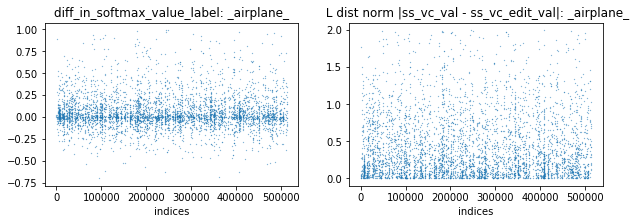

...

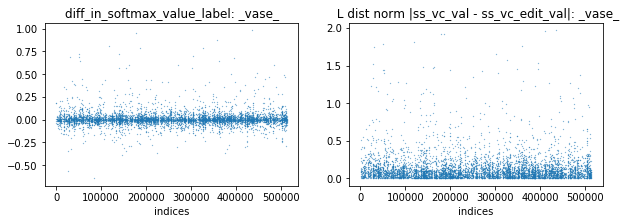

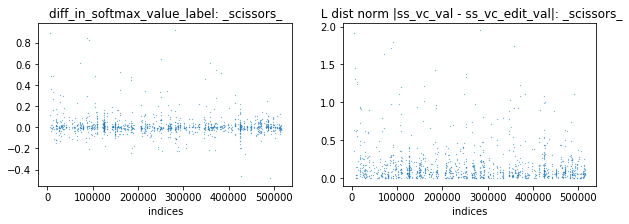

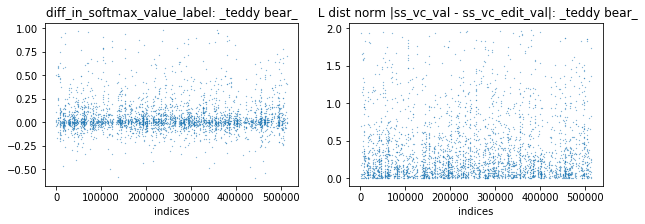

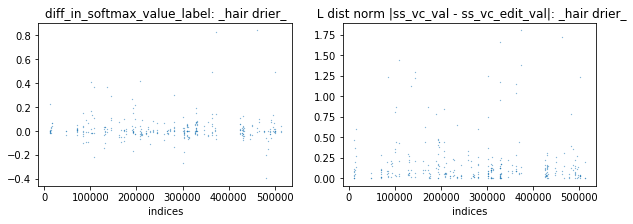

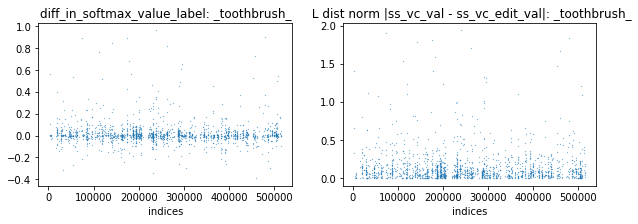

In [14]:
##PLOTTING diff_in softmax and l_dist_norm side by side- in case you notice any pattern!
for i in coco_dict_inv.keys():
    #print('object removed:', i)
    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, CLASS=i)

    f = plt.figure(figsize=(10,3))  ##(8,2.5)
    ax = f.add_subplot(121)
    ax2 = f.add_subplot(122)
    
    ax.set_title('diff_in_softmax_value_label: {}'.format(plt_title_suffix))
    ax.scatter(chosen_indices, chosen_diff_list_value, cmap=plt.cm.gist_ncar, s=0.05)
    ax.set_xlabel('indices')

    ax2.set_title(' L dist norm |ss_vc_val - ss_vc_edit_val|: {}'.format(plt_title_suffix))
    ax2.scatter(chosen_indices, chosen_diff_list_norm, cmap=plt.cm.gist_ncar, s=0.05)
    ax2.set_xlabel('indices')
    
    sample_dir = './exp_vqa/interesting_findings/' + str(plt_title_suffix) +'/'
    os.makedirs(sample_dir, exist_ok=True)


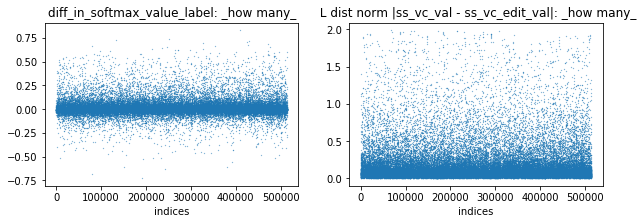

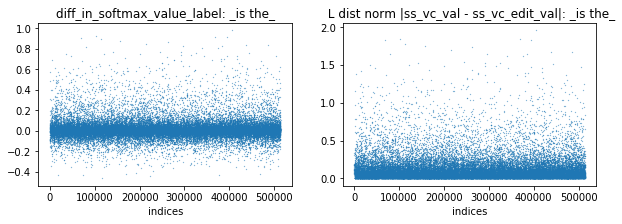

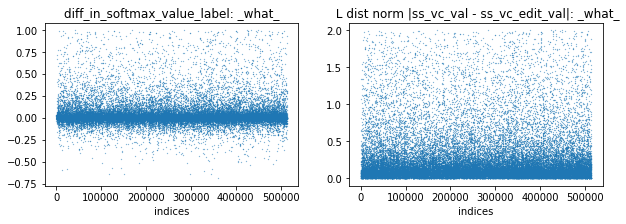

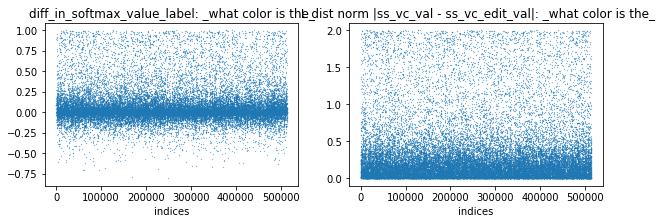

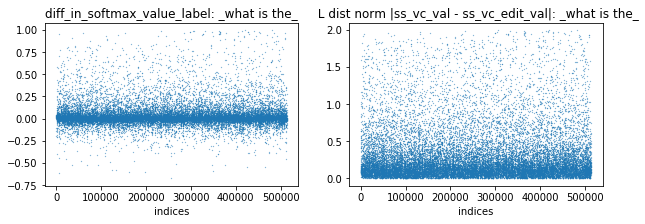

...

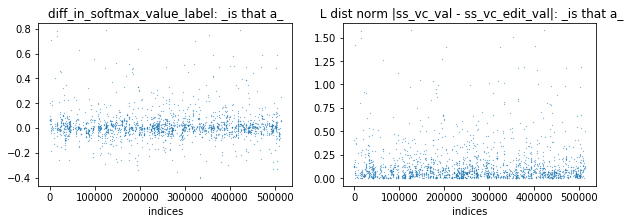

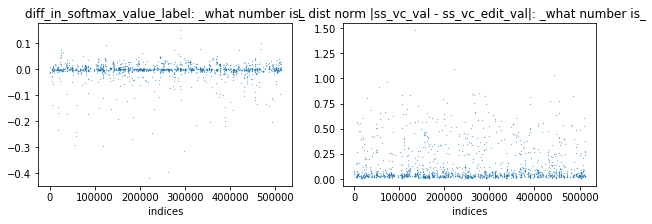

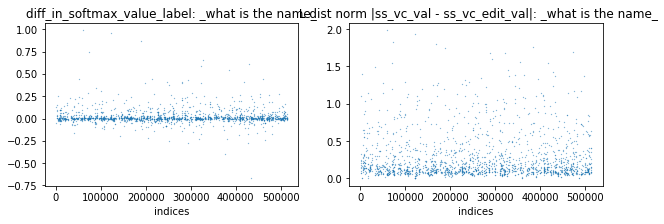

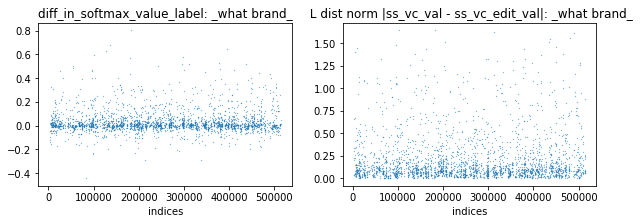

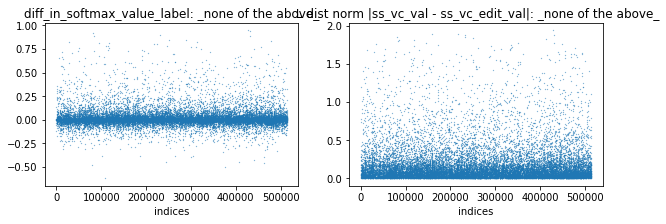

In [15]:
for i in ques_type_off:
    ### creating directories for saving interesting results
    #print('ques_type:', i)

    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, QUES_TYPE=i)

    f = plt.figure(figsize=(10,3))
    ax = f.add_subplot(121)
    ax2 = f.add_subplot(122)
    
    ax.set_title('diff_in_softmax_value_label: {}'.format(plt_title_suffix))
    ax.scatter(chosen_indices, chosen_diff_list_value, cmap=plt.cm.gist_ncar, s=0.05)
    ax.set_xlabel('indices')

    ax2.set_title(' L dist norm |ss_vc_val - ss_vc_edit_val|: {}'.format(plt_title_suffix))
    ax2.scatter(chosen_indices, chosen_diff_list_norm, cmap=plt.cm.gist_ncar, s=0.05)
    ax2.set_xlabel('indices')

        
    sample_dir = './exp_vqa/interesting_findings/' + str(plt_title_suffix) +'/'
    os.makedirs(sample_dir, exist_ok=True)


ans_type: yes/no
ans_type: number
ans_type: other


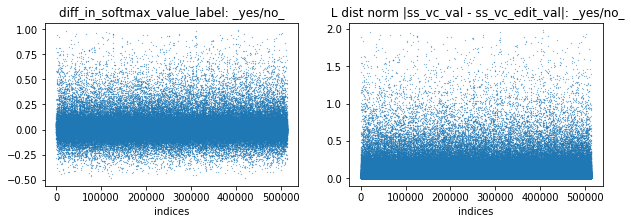

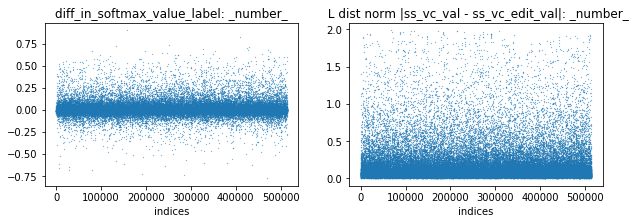

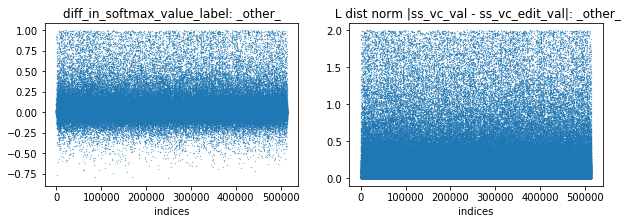

In [13]:
for i in ans_type_off:
    print('ans_type:', i)

    chosen_indices, chosen_diff_list_norm, chosen_diff_list_value, plt_title_suffix = get_indices_diff_list_suffix(
        coco_dict_inv,img_ids_edit_val, ques_type_edit_val, ans_type_edit_val, L_norm_diff, diff_ss_val_label, ANS_TYPE=i)
    
    f = plt.figure(figsize=(10,3))
    ax = f.add_subplot(121)
    ax2 = f.add_subplot(122)
    
    ax.set_title('diff_in_softmax_value_label: {}'.format(plt_title_suffix))
    ax.scatter(chosen_indices, chosen_diff_list_value, cmap=plt.cm.gist_ncar, s=0.05)
    ax.set_xlabel('indices')

    ax2.set_title(' L dist norm |ss_vc_val - ss_vc_edit_val|: {}'.format(plt_title_suffix))
    ax2.scatter(chosen_indices, chosen_diff_list_norm, cmap=plt.cm.gist_ncar, s=0.05)
    ax2.set_xlabel('indices')
    
        
    sample_dir = './exp_vqa/interesting_findings/' + str(plt_title_suffix) +'/'
    os.makedirs(sample_dir, exist_ok=True)